In [152]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [153]:
df = pd.read_csv("/content/Homestays_Data.csv",encoding = 'latin-1', engine="python")


# **Introduction:**
The dataset encompasses 9999 rows and 29 columns, offering a rich assortment of attributes related to homestay listings. These attributes include property type, room type, amenities, host information, and geographical coordinates, among others. The target variable, log_price, represents the logarithm of the listing price. This dataset serves as a valuable resource for gaining insights into homestay pricing dynamics and optimizing pricing strategies.

# **Objective**:
The primary aim is to develop a robust predictive model to estimate the log_price of homestay listings based on their attributes and characteristics. By leveraging comprehensive analysis and predictive modeling techniques, the objective is to accurately predict listing prices and provide actionable insights for hosts and stakeholders in the hospitality industry.

# **Solution:**
Implemented EDA to explore correlations between pricing and attributes, guiding feature engineering. Proceeded to model implementation, starting with linear regression and progressing to RNNs, leveraging insights for robust pricing predictions.

# About Dataset

In [154]:
df

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds
0,6901257,5.010635,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,...,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100,https://a0.muscache.com/im/pictures/6d7cbbf7-c...,11201,1,1
1,6304928,5.129899,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,...,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93,https://a0.muscache.com/im/pictures/348a55fe-4...,10019,3,3
2,7919400,4.976734,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,...,40.808110,-73.943756,The Garden Oasis,Harlem,10,92,https://a0.muscache.com/im/pictures/6fae5362-9...,10027,1,3
3,13418779,6.620073,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,...,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,https://a0.muscache.com/im/pictures/72208dad-9...,94117,2,2
4,3808709,4.744932,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,...,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40,NaN,20009,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,5447420,5.438079,Apartment,Entire home/apt,"{""Family/kid friendly""}",1,1.0,Real Bed,flexible,False,...,37.801659,-122.420979,Furnished San Francisco Apartment,Russian Hill,0,NaN,https://a0.muscache.com/im/pictures/1ae96052-1...,94109,1,1
9995,1591811,4.499810,Guesthouse,Entire home/apt,"{TV,""Wireless Internet"",Kitchen,Heating,""Famil...",2,1.0,Real Bed,flexible,False,...,34.124576,-118.202595,Lovely guesthouse in Highland Park,Highland Park,6,97,https://a0.muscache.com/im/pictures/f048cfc4-8...,90042,0,1
9996,14761805,4.787492,Condominium,Entire home/apt,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",2,1.0,Real Bed,strict,True,...,33.767661,-118.195456,Convention Ctr. Close City View,Long Beach,29,95,https://a0.muscache.com/im/pictures/268d2f1c-9...,90802,1,1
9997,7500518,5.105945,Apartment,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",2,1.0,Real Bed,strict,True,...,37.764780,-122.467929,Lovely apt! Across from GG Park!,Inner Sunset,5,95,https://a0.muscache.com/im/pictures/62241057/a...,94122,1,1


In [155]:
df.shape

(9999, 29)

In [156]:
df.columns

Index(['id', 'log_price', 'property_type', 'room_type', 'amenities',
       'accommodates', 'bathrooms', 'bed_type', 'cancellation_policy',
       'cleaning_fee', 'city', 'description', 'first_review',
       'host_has_profile_pic', 'host_identity_verified', 'host_response_rate',
       'host_since', 'instant_bookable', 'last_review', 'latitude',
       'longitude', 'name', 'neighbourhood', 'number_of_reviews',
       'review_scores_rating', 'thumbnail_url', 'zipcode', 'bedrooms', 'beds'],
      dtype='object')

In [157]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      9999 non-null   int64  
 1   log_price               9999 non-null   float64
 2   property_type           9999 non-null   object 
 3   room_type               9999 non-null   object 
 4   amenities               9999 non-null   object 
 5   accommodates            9999 non-null   int64  
 6   bathrooms               9975 non-null   float64
 7   bed_type                9999 non-null   object 
 8   cancellation_policy     9999 non-null   object 
 9   cleaning_fee            9999 non-null   bool   
 10  city                    9999 non-null   object 
 11  description             9999 non-null   object 
 12  first_review            7819 non-null   object 
 13  host_has_profile_pic    9963 non-null   object 
 14  host_identity_verified  9963 non-null   

In [158]:
df.isnull().sum()

id                           0
log_price                    0
property_type                0
room_type                    0
amenities                    0
accommodates                 0
bathrooms                   24
bed_type                     0
cancellation_policy          0
cleaning_fee                 0
city                         0
description                  0
first_review              2180
host_has_profile_pic        36
host_identity_verified      36
host_response_rate        2497
host_since                  36
instant_bookable             0
last_review               2172
latitude                     0
longitude                    0
name                         0
neighbourhood              890
number_of_reviews            3
review_scores_rating      2282
thumbnail_url             1130
zipcode                    154
bedrooms                    14
beds                        18
dtype: int64

# Cleaning the Dataset

**Filling out Missing Values**

---



In [159]:
numerical_features = ['bathrooms', 'bedrooms', 'beds','review_scores_rating','number_of_reviews','last_review','first_review','host_since']
for feature in numerical_features:
    df[feature].fillna(method='bfill', inplace=True)

In [160]:
categorical_features = ['host_has_profile_pic', 'host_identity_verified','host_response_rate']
for feature in categorical_features:
    df[feature].fillna(df[feature].mode()[0], inplace=True)

In [161]:
columns_to_fill = ['zipcode', 'neighbourhood','thumbnail_url','name','description']
for column in columns_to_fill:
    df[column].fillna(f'No {column}', inplace=True)

In [162]:
df.isnull().sum()

id                        0
log_price                 0
property_type             0
room_type                 0
amenities                 0
accommodates              0
bathrooms                 0
bed_type                  0
cancellation_policy       0
cleaning_fee              0
city                      0
description               0
first_review              0
host_has_profile_pic      0
host_identity_verified    0
host_response_rate        0
host_since                0
instant_bookable          0
last_review               0
latitude                  0
longitude                 0
name                      0
neighbourhood             0
number_of_reviews         0
review_scores_rating      0
thumbnail_url             0
zipcode                   0
bedrooms                  0
beds                      0
dtype: int64

 **Dealing With Special Characters**

---



In [163]:
rows_with_question_mark = df.apply(lambda row: row.str.contains('\?+', na=False).any(), axis=1)
rows_with_question_mark = rows_with_question_mark[rows_with_question_mark == True]

if not rows_with_question_mark.empty:
    print("There are rows containing question marks.")
else:
    print("There are no rows containing question marks.")

There are rows containing question marks.


In [164]:
df.replace(r'\?+', np.nan, regex=True, inplace=True)

In [165]:
rows_with_question_mark = df.apply(lambda row: row.str.contains('\?+', na=False).any(), axis=1)
rows_with_question_mark = rows_with_question_mark[rows_with_question_mark == True]

if not rows_with_question_mark.empty:
    print("There are rows containing question marks.")
else:
    print("There are no rows containing question marks.")

There are no rows containing question marks.


**Checking for Duplicates**

---



In [166]:
df_transposed = df.T
df_transposed.duplicated()

id                        False
log_price                 False
property_type             False
room_type                 False
amenities                 False
accommodates              False
bathrooms                 False
bed_type                  False
cancellation_policy       False
cleaning_fee              False
city                      False
description               False
first_review              False
host_has_profile_pic      False
host_identity_verified    False
host_response_rate        False
host_since                False
instant_bookable          False
last_review               False
latitude                  False
longitude                 False
name                      False
neighbourhood             False
number_of_reviews         False
review_scores_rating      False
thumbnail_url             False
zipcode                   False
bedrooms                  False
beds                      False
dtype: bool

# Feature Engineering



1.   Enhance the dataset by creating actionable and insightful features. Calculate `Host_Tenure` by determining the number of years from `host_since` to the current date, providing a measure of host
experience.
2. Generate `Amenities_Count` by counting the items listed in the `amenities` array to quantifyproperty offerings.
3. Determine `Days_Since_Last_Review` by calculating the days between `last_review` and today to assess listing activity and relevance.




**Host_Tenure and Days_Since_Last_Review**

---



In [167]:
date_columns = ['host_since', 'first_review','last_review']

for column in date_columns:
    df[column] = pd.to_datetime(df[column])

df['host_since']

<ipython-input-167-6ff7c6c6690e>:4: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df[column] = pd.to_datetime(df[column])
<ipython-input-167-6ff7c6c6690e>:4: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df[column] = pd.to_datetime(df[column])
<ipython-input-167-6ff7c6c6690e>:4: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df[column] = pd.to_datetime(df[column])


0      2012-03-26
1      2017-06-19
2      2016-10-25
3      2015-04-19
4      2015-03-01
          ...    
9994   2013-07-15
9995   2017-01-20
9996   2015-03-16
9997   2013-12-18
9998   2016-05-15
Name: host_since, Length: 9999, dtype: datetime64[ns]

In [168]:
import datetime

# Convert 'host_since' column to datetime format
#df['host_since'] = pd.to_datetime(df['host_since'])
current_date = pd.Timestamp(datetime.date.today())

# Calculating the host tenure in years
df['Host_Tenure'] = (current_date - df['host_since']).dt.days / 365.25
df['Host_Tenure']

0       12.131417
1        6.899384
2        7.548255
3        9.067762
4        9.201916
          ...    
9994    10.828200
9995     7.310062
9996     9.160849
9997    10.401095
9998     7.994524
Name: Host_Tenure, Length: 9999, dtype: float64

In [169]:
df['Days_Since_Last_Review'] = (current_date - df['last_review']).dt.days
df['Days_Since_Last_Review']

0       2856
1       2424
2       2433
3       2668
4       2668
        ... 
9994    2570
9995    2570
9996    2596
9997    2835
9998    2432
Name: Days_Since_Last_Review, Length: 9999, dtype: int64

In [170]:
df['amenities']

0       {"Wireless Internet","Air conditioning",Kitche...
1       {"Wireless Internet","Air conditioning",Kitche...
2       {TV,"Cable TV","Wireless Internet","Air condit...
3       {TV,"Cable TV",Internet,"Wireless Internet",Ki...
4       {TV,Internet,"Wireless Internet","Air conditio...
                              ...                        
9994                              {"Family/kid friendly"}
9995    {TV,"Wireless Internet",Kitchen,Heating,"Famil...
9996    {TV,Internet,"Wireless Internet",Kitchen,"Free...
9997    {TV,"Cable TV",Internet,"Wireless Internet",Ki...
9998    {"Pets live on this property",Dog(s),"Smoke de...
Name: amenities, Length: 9999, dtype: object

**Amenities_Count**

---



In [171]:
df['Amenities_Count'] = df['amenities'].str.count(',')

# Since counting commas gives the number of items minus one,we add 1 to ensure we include the last item in the amenities list.
df['Amenities_Count'] += 1
df['Amenities_Count']

0        9
1       15
2       19
3       15
4       12
        ..
9994     1
9995    11
9996    17
9997    15
9998    13
Name: Amenities_Count, Length: 9999, dtype: int64

# Exploratory Data Analysis
1. Conduct a deep dive into the dataset to uncover underlying patterns and relationships. Analyze how pricing (`log_price`) correlates with both categorical (such as `room_type` and `property_type`) and
numerical features (like `accommodates` and `number_of_reviews`).
2.Utilize statistical tools andvisualizations such as correlation matrices, histograms for distribution analysis, and scatter plots to explore relationships between variables.

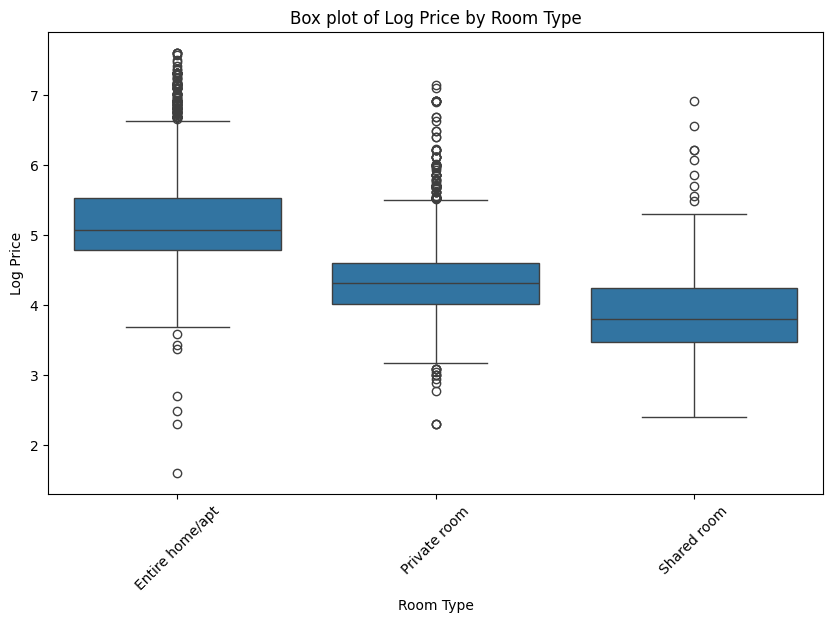

In [172]:
# Box plot for room_type vs. log_price
plt.figure(figsize=(10, 6))
sns.boxplot(x='room_type', y='log_price', data=df)
plt.title('Box plot of Log Price by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Log Price')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

* The y-axis represents the log price, ranging from 0 to 7
* while the x-axis categorizes the data by room type.
* The plot for "Entire home/apt" shows a higher median log price compared to the other room types, indicating it tends to be more expensive.
* "Private room" and "Shared room" have lower median values, with "Shared room" showing the least variation in log price
* outliers shows a high variability pricing within the same room type category, possibly due to factors like location, amenities, or special conditions of the property.

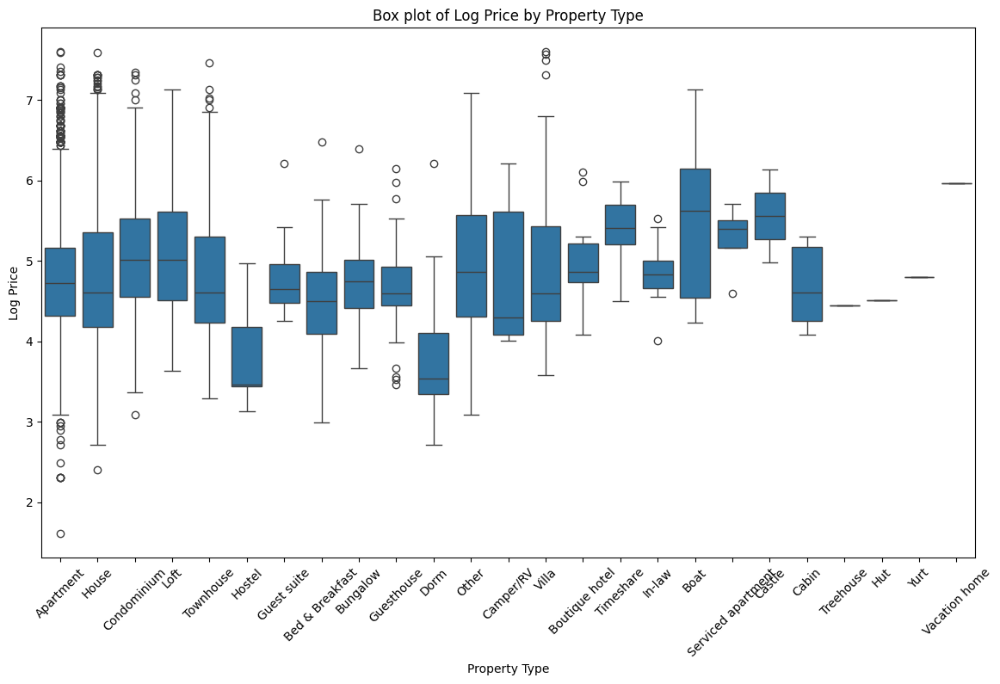

In [173]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='property_type', y='log_price', data=df)
plt.title('Box plot of Log Price by Property Type')
plt.xlabel('Property Type')
plt.ylabel('Log Price')
plt.xticks(rotation=45)
plt.show()

* The y-axis represents the log price, ranging from 0 to 7
* while the x-axis categorizes the data by Property type.
* Properties like "Dorm" or "Hostel" show lower median prices and narrower ranges, suggesting more budget-friendly options.
* When "Vacation home" has the highest median but no box or whiskers, it means either there's only one data point for 'Vacation home' or all data points have the same value. This lack of variability results in no box or whiskers being drawn.
* Compared to all other property types, apartments have more outliers. This indicates that there is greater variability in prices for apartments, with some apartments being priced significantly higher or lower than the majority.

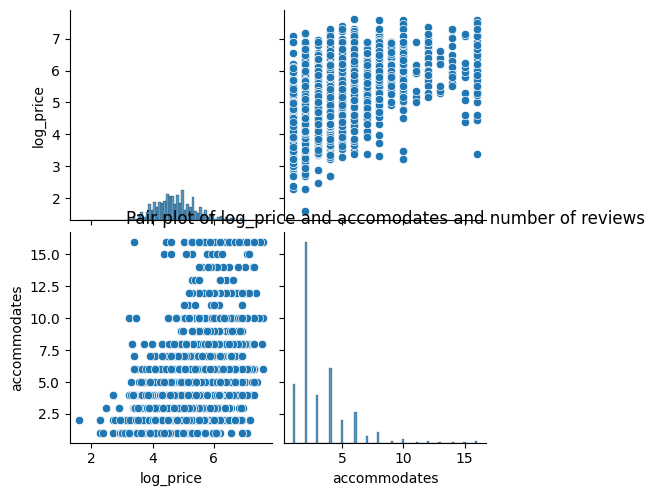

In [174]:
sns.pairplot(df[['log_price', 'accommodates', 'number_of_reviews']])
plt.title('Pair plot of log_price and accomodates and number of reviews')
plt.show()

In [175]:
!pip install ydata_profiling

In [176]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Geospatial Analysis:
 Investigate the geographical data to understand regional pricing trends. Plot listings on a map using`latitude` and `longitude` data to visually assess price distribution. Examine if certain neighbourhoods orproximity to city centres influence pricing, providing a spatial perspective to the pricing strategy.

In [177]:
"""import folium

# Create a map without specifying the center
mymap = folium.Map(zoom_start=10)

# Add markers for each listing
for index, row in df.iterrows():
    # Extract latitude and longitude
    lat, lon = row['latitude'], row['longitude']
    # Create a popup message with listing information
    popup_text = f"<b>{row['name']}</b><br>Price: {row['log_price']}<br>Neighborhood: {row['neighbourhood']}"
    # Add marker to the map
    folium.Marker([lat, lon], popup=popup_text).add_to(mymap)

# Display the map
mymap"""

'import folium\n\n# Create a map without specifying the center\nmymap = folium.Map(zoom_start=10)\n\n# Add markers for each listing\nfor index, row in df.iterrows():\n    # Extract latitude and longitude\n    lat, lon = row[\'latitude\'], row[\'longitude\']\n    # Create a popup message with listing information\n    popup_text = f"<b>{row[\'name\']}</b><br>Price: {row[\'log_price\']}<br>Neighborhood: {row[\'neighbourhood\']}"\n    # Add marker to the map\n    folium.Marker([lat, lon], popup=popup_text).add_to(mymap)\n\n# Display the map\nmymap'

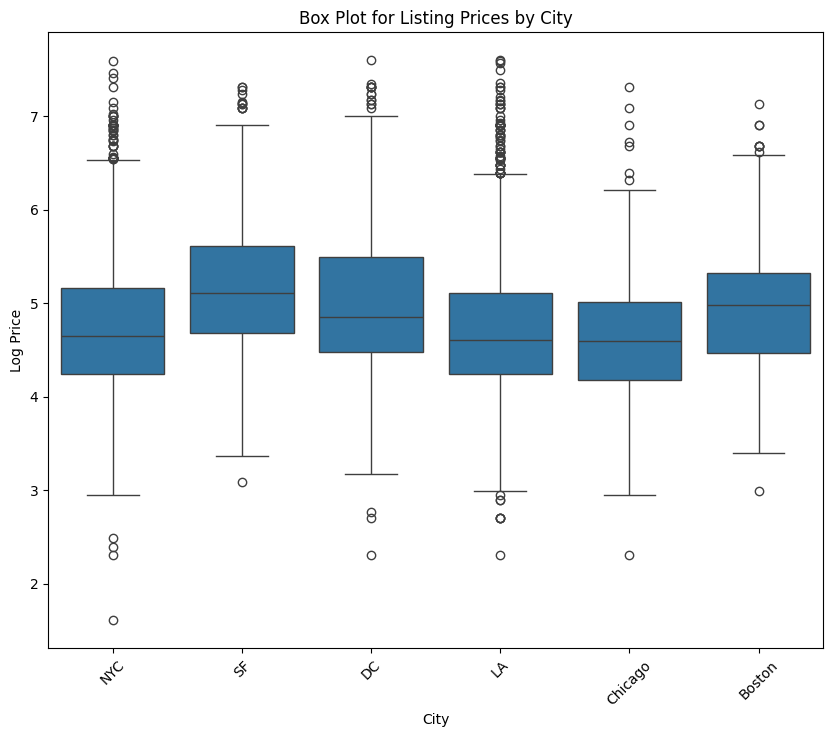

In [178]:
plt.figure(figsize=(10, 8))  # Box Plot for Prices by City
sns.boxplot(x='city', y='log_price', data=df)
plt.title('Box Plot for Listing Prices by City')
plt.xlabel('City')
plt.ylabel('Log Price')
plt.xticks(rotation=45)
plt.show()

# Sentiment Analysis on Textual Data
Apply advanced natural language processing techniques to the `description` texts to extract
sentiment scores. Use sentiment analysis tools to determine whether positive or negative descriptions
influence listing prices, incorporating these findings into the predictive model being trained as a feature.

In [179]:
import nltk
nltk.download("all")

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package basque_grammars is already up-to-date!
[nltk_data]    | Downloading package bcp47 to /root/nltk_data...
[nltk_data]    |   Package bcp47 is already up-to-dat

True

**Taking the first description as data for defining functions to calculate Positive and Negative Score**


---



In [180]:
data = """Beautiful, sunlit brownstone 1-bedroom in the loveliest neighborhood in Brooklyn. Blocks from the promenade and Brooklyn Bridge Park, with their stunning views of Manhattan, and from the great shopping and food."""

**Tokenizing & as well as removing the stop words from data..**

---



In [181]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Define tokenizer function
def tokenizer(text):
    stop_words = set(stopwords.words('english'))
    if isinstance(text, str):  # Check if text is a string
        tokens = nltk.word_tokenize(text.lower())
        filtered_words = [token for token in tokens if token not in stop_words]
        filtered_words = [word for word in filtered_words if word.isalnum()]
        return filtered_words
    else:
        return []

filtered_words = tokenizer(data)

In [182]:
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer


def positive_score(words):
    # Initialize the VADER sentiment analyzer
    sia = SentimentIntensityAnalyzer()
    pos_score = 0

    # Calculate sentiment scores for each word and sum up positive scores
    for word in words:
        sentiment_scores = sia.polarity_scores(word)
        pos_score += sentiment_scores['pos']

    return pos_score

positive_score(filtered_words)

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


3.0

In [183]:
def negative_score(words):
    # Initialize the VADER sentiment analyzer
    sia = SentimentIntensityAnalyzer()
    neg_score = 0

    # Calculate sentiment scores for each word and sum up positive scores
    for word in words:
        sentiment_scores = sia.polarity_scores(word)
        neg_score += sentiment_scores['neg']

    return neg_score

negative_score(filtered_words)

1.0

**Caculating "positive_score" & "negative_score" for df through defined functions..**

---



In [184]:
df['Tokens'] = df['description'].apply(tokenizer)
df['positive_score'] = df['Tokens'].apply(positive_score)
df['negative_score'] = df['Tokens'].apply(negative_score)
df = df.drop(['Tokens'],axis = 1)
df['positive_score']

0        3.0
1       11.0
2        6.0
3        5.0
4        5.0
        ... 
9994     2.0
9995    11.0
9996     6.0
9997    14.0
9998     6.0
Name: positive_score, Length: 9999, dtype: float64

# Amenities Analysis
Thoroughly parse and analyse the `amenities` provided in the listings. Identify which amenities are most associated with higher or lower prices by applying statistical tests to determine correlations, thereby informing both pricing strategy and model inputs.

In [185]:
df['amenities'][1]

'{"Wireless Internet","Air conditioning",Kitchen,Heating,"Family/kid friendly",Washer,Dryer,"Smoke detector","Fire extinguisher",Essentials,Shampoo,Hangers,"Hair dryer",Iron,"translation missing: en.hosting_amenity_50"}'

In [186]:
# Extracting the amenities column as a list of sets
amenities_list = []
for amenities in df['amenities']:
    if isinstance(amenities, str):
        amenities_list.append(set(amenities.strip('{}').split(',')))
    elif isinstance(amenities, list):
        amenities_list.append(set(amenities))
    else:
        amenities_list.append(set())

# Creating a binary matrix of amenities
unique_amenities = list(set.union(*amenities_list))
amenities_matrix = pd.DataFrame(0, index=df.index, columns=unique_amenities)
for i, amenities in enumerate(amenities_list):
    for amenity in amenities:
        amenities_matrix.loc[i, amenity] = 1

In [187]:
amenities_matrix

,,Crib,Elevator,"""Pack n Play/travel crib""","""Fixed grab bars for shower & toilet""","""Bathtub with shower chair""","""Hot water""","""Suitable for events""","""Outlet covers""","""Single level home""",...,"""Game console""","""Family/kid friendly""",Keypad,"""Hot water kettle""",Breakfast,Doorman,"""Childrens books and toys""","""Other pet(s)""","""Air purifier""","""Indoor fireplace"""
0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9995,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9996,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
9997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [188]:
# Calculating the correlation between each amenity and property price
from scipy.stats import pearsonr
correlations = {}
for col in amenities_matrix.columns:
    r, p = pearsonr(amenities_matrix[col], df['log_price'])
    correlations[col] = r

# Sorting the amenities by correlation coefficient
sorted_correlations = sorted(correlations.items(), key=lambda x: x[1], reverse=True)

print("Top Amenities Associated with Higher Prices:")
for amenity, correlation in sorted_correlations[:5]:
    print(f"{amenity}: Correlation coefficient = {correlation:.2f}")

print("\nTop Amenities Associated with Lower Prices:")
for amenity, correlation in sorted_correlations[-5:]:
    print(f"{amenity}: Correlation coefficient = {correlation:.2f}")

Top Amenities Associated with Higher Prices:
"Family/kid friendly": Correlation coefficient = 0.29
TV: Correlation coefficient = 0.27
"Cable TV": Correlation coefficient = 0.25
Dryer: Correlation coefficient = 0.18
"Indoor fireplace": Correlation coefficient = 0.18

Top Amenities Associated with Lower Prices:
Cat(s): Correlation coefficient = -0.08
"Pets live on this property": Correlation coefficient = -0.10
"Lock on bedroom door": Correlation coefficient = -0.13
"translation missing: en.hosting_amenity_50": Correlation coefficient = -0.21
"translation missing: en.hosting_amenity_49": Correlation coefficient = -0.23


# Categorical Data Encoding
Convert categorical data into a format suitable for machine learning analysis. Apply one-hot encoding
to variables like `room_type`, `city`, and `property_type`, ensuring that the model can interpret these as
distinct features without any ordinal implication.

In [189]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 34 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      9999 non-null   int64         
 1   log_price               9999 non-null   float64       
 2   property_type           9999 non-null   object        
 3   room_type               9999 non-null   object        
 4   amenities               9999 non-null   object        
 5   accommodates            9999 non-null   int64         
 6   bathrooms               9999 non-null   float64       
 7   bed_type                9999 non-null   object        
 8   cancellation_policy     9999 non-null   object        
 9   cleaning_fee            9999 non-null   bool          
 10  city                    9999 non-null   object        
 11  description             9590 non-null   object        
 12  first_review            9999 non-null   datetime

In [190]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()

In [191]:
for i in df.columns:
  if df[i].dtype == 'object':
    df[i] = enc.fit_transform(df[i])

In [192]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 34 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      9999 non-null   int64         
 1   log_price               9999 non-null   float64       
 2   property_type           9999 non-null   int64         
 3   room_type               9999 non-null   int64         
 4   amenities               9999 non-null   int64         
 5   accommodates            9999 non-null   int64         
 6   bathrooms               9999 non-null   float64       
 7   bed_type                9999 non-null   int64         
 8   cancellation_policy     9999 non-null   int64         
 9   cleaning_fee            9999 non-null   bool          
 10  city                    9999 non-null   int64         
 11  description             9999 non-null   int64         
 12  first_review            9999 non-null   datetime

**droping the columns which are irrelevant to "log_price" feature..and also deleting the first_review & lasyt_reviw cause we have already calculated `Days_Since_Last_Review` & `Host_Tenure` **




In [193]:
df.drop(['id','name','first_review','last_review'],axis=1,inplace = True)

In [194]:
df.drop(['host_since'],axis = 1, inplace= True)

In [195]:
df.corr()

,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,...,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds,Host_Tenure,Days_Since_Last_Review,Amenities_Count,positive_score,negative_score
log_price,1.000000,0.042119,-0.605045,0.131788,0.568975,0.364823,0.093128,0.137661,0.105374,0.020909,...,-0.013195,-0.148077,0.040037,0.482730,0.477430,0.074966,0.009708,0.216511,-0.003503,0.018238
property_type,0.042119,1.000000,0.096109,-0.010376,0.167707,0.253231,0.009732,0.022804,0.022796,-0.093949,...,0.006909,-0.007720,0.303418,0.201731,0.129658,-0.007771,-0.002286,0.103824,0.020525,-0.085726
room_type,-0.605045,0.096109,1.000000,-0.128544,-0.463151,-0.125039,-0.134399,-0.178679,-0.205837,0.062918,...,-0.018678,0.136291,-0.014746,-0.298881,-0.431961,-0.082346,-0.013297,-0.187135,-0.026260,-0.048331
amenities,0.131788,-0.010376,-0.128544,1.000000,0.100090,0.033248,0.043877,0.003586,0.033191,-0.010164,...,0.021151,-0.010995,0.110044,0.065582,0.083349,-0.003247,0.025115,0.098940,-0.017494,-0.014077
accommodates,0.568975,0.167707,-0.463151,0.100090,1.000000,0.515544,0.065491,0.207009,0.174314,-0.086816,...,0.044142,-0.094372,0.097417,0.686102,0.700998,-0.012339,-0.037551,0.267747,0.038199,-0.029233
bathrooms,0.364823,0.253231,-0.125039,0.033248,0.515544,1.000000,0.042113,0.099423,0.056609,-0.069112,...,-0.011501,-0.091980,0.124508,0.549266,0.372428,-0.000028,0.022167,0.171656,0.002771,-0.061503
bed_type,0.093128,0.009732,-0.134399,0.043877,0.065491,0.042113,1.000000,0.044824,0.023760,0.003600,...,-0.006702,-0.008373,0.005093,0.055060,0.074406,-0.014312,-0.029403,0.035241,0.003723,-0.003702
cancellation_policy,0.137661,0.022804,-0.178679,0.003586,0.207009,0.099423,0.044824,1.000000,0.342794,-0.025535,...,0.134511,-0.028181,-0.023999,0.136665,0.183760,0.139259,-0.109740,0.230582,0.171085,0.057318
cleaning_fee,0.105374,0.022796,-0.205837,0.033191,0.174314,0.056609,0.023760,0.342794,1.000000,-0.036457,...,0.061830,-0.032798,0.046924,0.112511,0.157156,0.110796,-0.078240,0.244793,0.170537,0.040161
city,0.020909,-0.093949,0.062918,-0.010164,-0.086816,-0.069112,0.003600,-0.025535,-0.036457,1.000000,...,0.000574,0.066649,-0.042806,-0.055717,-0.052930,0.063006,-0.052392,-0.116488,0.025682,0.082505


# Model Development and Training
Design and train predictive models to estimate `log_price`. Begin with a simple linear regression to
establish a baseline, then explore more complex models such as RandomForest and GradientBoosting to
better capture non-linear relationships and interactions between features. Document (briefly within
Jupyter notebook itself) the model-building process, specifying the choice of algorithms and rationale.

In [247]:
X = df.drop(columns=['log_price'])
y = df['log_price']

(9999, 28)

In [197]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model Optimization and Validation
Task: Systematically optimize the models to achieve the best performance. Employ techniques like grid
search to experiment with different hyperparameters settings. Validate model choices through techniques
like k-fold cross-validation, ensuring the model generalizes well to unseen data.
# Predictive Performance Assessment:
Task: Critically evaluate the performance of the final model on a reserved test set. Use metrics such as
Root Mean Squared Error (RMSE) and R-squared to assess accuracy and goodness of fit. Provide a detailed
analysis of the residuals to check for any patterns that might suggest model biases or misfit.

**Using Machine Learning Model:**

---



In [198]:
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.metrics import r2_score, mean_squared_error

In [199]:
from sklearn.model_selection import KFold, cross_val_score
models = [LinearRegression(), Ridge()]
def com_crossvalscore():
  for model in models:
    k_folds = KFold(n_splits = 10)
    scores = cross_val_score(model , X, y, cv = k_folds)
    mean_accuracy = sum(scores)/len(scores)
    mean_accuracy = mean_accuracy*100
    mean_accuracy = round(mean_accuracy,2)
    print('cross validation accuracies for',model, ' = ', scores)
    print('Accuracy % of',model, mean_accuracy)
    print('--------------')

In [200]:
com_crossvalscore()

cross validation accuracies for LinearRegression()  =  [0.5325938  0.47931411 0.56043169 0.56023741 0.54025376 0.558796
 0.53963408 0.50346998 0.55413238 0.54722752]
Accuracy % of LinearRegression() 53.76
--------------
cross validation accuracies for Ridge()  =  [0.5325907  0.47930296 0.56044799 0.56023667 0.54026932 0.55879535
 0.53963637 0.50349105 0.55415316 0.54723348]
Accuracy % of Ridge() 53.76
--------------


In [201]:
models = {'Linear Regression': LinearRegression(),'Ridge': Ridge()}

In [202]:
params_grid = {
    'Linear Regression': {},
    'Ridge': {'alpha': [0.1, 1.0, 10.0]},
}

In [203]:
from sklearn.model_selection import GridSearchCV
scoring = 'neg_mean_squared_error'
best_models = {}

for name, model in models.items():
    grid_search = GridSearchCV(model, params_grid[name], scoring=scoring, cv=5)
    grid_search.fit(x_train, y_train)
    best_models[name] = grid_search.best_estimator_

In [204]:
cv_results = {}  #Initiallizing the loop for selecting the best model with the help of Cross Validation model
for name, model in best_models.items():
    cv_score = cross_val_score(model, x_train, y_train, scoring=scoring, cv=5)
    cv_results[name] = cv_score

In [205]:
cv_mean_scores = {name: scores.mean() for name, scores in cv_results.items()}
best_model_name = min(cv_mean_scores, key=cv_mean_scores.get)
best_model = best_models[best_model_name]

In [206]:
best_model.fit(x_train, y_train)

LinearRegression()

In [207]:
Y_predict = best_model.predict(x_test)
rmse = np.sqrt(mean_squared_error(y_test, Y_predict))
print("For Model:",best_model,'rootmeansqerror = ',rmse)

For Model: LinearRegression() rootmeansqerror =  0.4922154375349284


**Using Deep Learning Model**

---



In [208]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN, Dropout
from tensorflow.keras.optimizers import Adam

In [260]:
model = Sequential()
model.add(Dense(512, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(10, activation='softmax'))

In [261]:
model.compile(optimizer = 'rmsprop',
              loss = 'mse',
              metrics = ['mae'])

In [262]:
x_train['cleaning_fee'] = x_train['cleaning_fee'].astype(int)
x_test['cleaning_fee'] = x_test['cleaning_fee'].astype(int)

In [263]:
model.fit(x_train,y_train,epochs = 30, batch_size=64)

Epoch 1/30
125/125 [==============================] - 3s 13ms/step - loss: 22.6886 - mae: 4.6997
Epoch 2/30
125/125 [==============================] - 2s 16ms/step - loss: 22.6887 - mae: 4.6997
Epoch 3/30
125/125 [==============================] - 1s 11ms/step - loss: 22.6887 - mae: 4.6997
Epoch 4/30
125/125 [==============================] - 1s 12ms/step - loss: 22.6887 - mae: 4.6997
Epoch 5/30
125/125 [==============================] - 1s 10ms/step - loss: 22.6886 - mae: 4.6997
Epoch 6/30
125/125 [==============================] - 1s 7ms/step - loss: 22.6887 - mae: 4.6997
Epoch 7/30
125/125 [==============================] - 1s 7ms/step - loss: 22.6886 - mae: 4.6997
Epoch 8/30
125/125 [==============================] - 1s 7ms/step - loss: 22.6887 - mae: 4.6997
Epoch 9/30
125/125 [==============================] - 1s 8ms/step - loss: 22.6887 - mae: 4.6997
Epoch 10/30
125/125 [==============================] - 1s 7ms/step - loss: 22.6886 - mae: 4.6997
Epoch 11/30
125/125 [=============

In [264]:
result = model.evaluate(x_test,y_test)
for i in range (len(result)):
  print(f'{model.metrics_names[i]}---> {result[i]}')

63/63 [==============================] - 1s 10ms/step - loss: 22.2698 - mae: 4.6542
loss---> 22.2697811126709
mae---> 4.654159069061279


# **Conclusion :**
Based on the initial machine learning model, which yielded an RMSE of 0.49, efforts were made to enhance predictive performance. This involved transitioning to a deep learning architecture, specifically an RNN with two dense layers and activation functions such as ReLU and softmax. Despite achieving a lower MAE, signifying improved precision in log price predictions, the primary goal was to minimize the loss of the model to enhance its overall fit for predictions.